# Plotting Animations of Land Cover

Let's plot pretty Land Cover Animations! Plotting animations of Land Cover over a specific area allows users to see the change occuring in the development of that landscape. An animation is a great way to odentify trends of change in a landscape, such a the expantion of urban areas in our cities. This notebook steps throuh using the lc_animation module demonstrating the different options for createing animations.

## Description
This notebook demonstrates how to:

1. Load a time series of DEA Land Cover data as an `xarray` dataset
2. Plot different layers of the data as animated maps
3. Plot the data as an animation beside a corresponding stacked line graph
4. Plot two Land Cover layers side by side as an animation
5. Export the resulting animations as either a GIF or MP4 file

***

### Load Packages

In [1]:
%matplotlib inline

import math
import sys
import os

import datacube
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

sys.path.insert(1, os.path.abspath('../Tools'))
from dea_tools.plotting import display_map
from dea_tools.land_cover import lc_animation


### Connect to the datacube

In [2]:
dc = datacube.Datacube(app='land_cover_animation')

## Load Land Cover time series data from the datacube

### Select area of interest

In [3]:
# lake Wallawalla
point_x, point_y = (-28.7448, 147.9323)


lat = (point_x - 0.1, point_x + 0.1)
lon = (point_y - 0.1, point_y + 0.1)

# display area on map
display_map(x=lon, y=lat)

### Build query and load data

for this example let's load the 

In [4]:
query = {
    "y": lat,
    "x": lon,
    "time": ("1988", "2021"),}

# Load DEA Land Cover data from the datacube
land_cover_data = dc.load(
    product="ga_ls_landcover_class_cyear_2",
    #              crs = "EPSG:3577",
    output_crs="EPSG:3577",
    measurements=["level3", "level4"],#, "level4", "canopyco_veg_cat_l4d"],
    resolution=(-25, 25),
    **query)

In [5]:
land_cover_data

<xarray.Dataset>
Dimensions:      (time: 33, y: 987, x: 879)
Coordinates:
  * time         (time) datetime64[ns] 1988-01-01 1989-01-01 ... 2020-01-01
  * y            (y) float64 -3.206e+06 -3.206e+06 ... -3.231e+06 -3.231e+06
  * x            (x) float64 1.523e+06 1.523e+06 ... 1.545e+06 1.545e+06
    spatial_ref  int32 3577
Data variables:
    level3       (time, y, x) uint8 112 112 112 112 112 ... 112 112 112 112 112
    level4       (time, y, x) int8 34 34 34 34 34 34 34 ... 34 34 34 34 34 34 34
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

## Plot Animation 

### Plot an animation of level 3

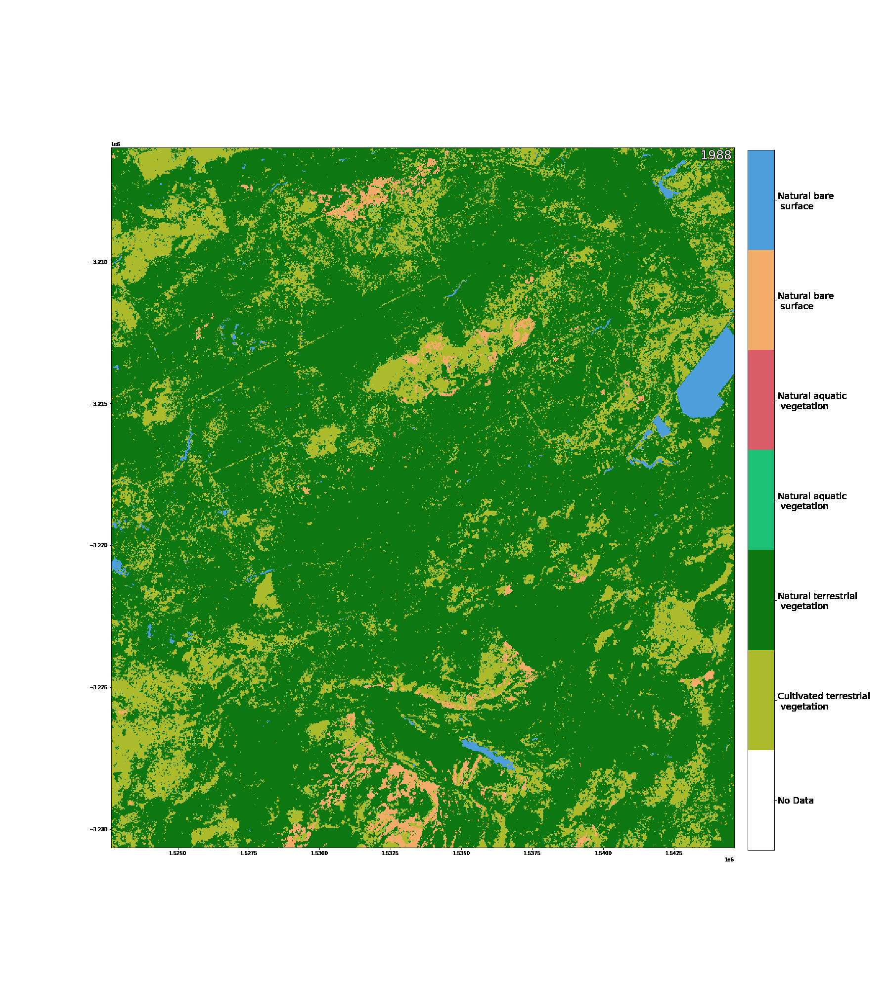

In [6]:
# plot animation using level 3

level_3 = land_cover_data["level3"]

lc_animation(level_3, layer="level3", stacked_plot=False, colour_bar=True)

### now plot level 4

Because of the number of classes and level of detail in the level 4 product plotting with out colour bar is recommended. 

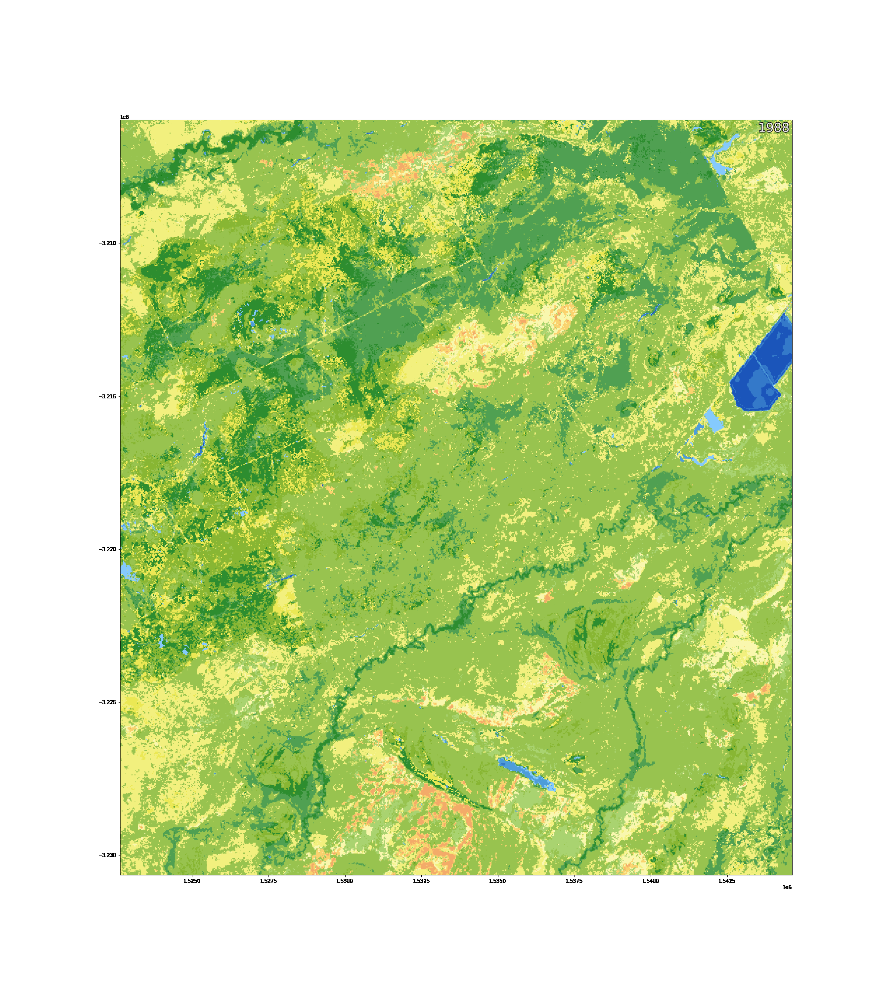

In [7]:
# # plot animation using level 3

level_4 = land_cover_data["level4"]

lc_animation(level_4, layer="level4", stacked_plot=False)

## Plot Animation with a stacked line plot

lc_animation also have an option to plot a stacked line graph beside the amination which updates year-by-year with the animation. This stacked line plot shows what percentage of the animated map is classified into each class in yeah year. Drawing out trends and relationships in class changes through time. this featrure can be used with all of the Land Cover layers avalible.

In [8]:
# do a grovy stack plot side by side
lc_animation(level_3, layer="canopyco_veg_cat_l4d", stacked_plot=True)

KeyError: 'class number not found in colour definition. Ensure layer name provided matches the dataset being used'

## Plot two maps side by side

maybe you want to look at how the entier landscape changes and also focus on a particular feature such as water or bare? 